<a href="https://colab.research.google.com/github/Ash-Stat/An-Si-Hyun/blob/data/Supply_Chain_Game_Simulator_made_by_Pythonash.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [17]:
import pandas as pd
import numpy as np
import math
demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
demand=pd.concat([demand,demand],axis=0)
xx=pd.DataFrame([[0,1]])
xx.columns=demand.columns
data1=pd.concat([xx,demand],axis=0)
data1=data1.reset_index().drop(['index'],axis=1)
data2=data1.copy()
data2['wip']=0
data2['warehouse']=0
data2['shipment']=0
data2['lost_demand']=0
data2['cost']=0
data2['cash']=2738867.06
data2['demand']=0
data2['process']=0
data2['shipping_way']=0
data2['profit']=0

data2=data2.drop(['Calopeia'],axis=1)

data2['demand'] = data1['Calopeia']
last=data2
last['cash'].iloc[1:] = 0
last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
last=pd.read_csv('./last.csv')
last=last.astype('float')
last=last.reset_index().drop(['index'],axis=1)
print(last)
for a,b,c,d,e,f,g,h,i,j,ind in zip(last['day'],last['wip'],last['warehouse'],last['shipment'],last['lost_demand'],last['cost'],last['cash'],last['demand'],last['process'],last['shipping_way'],last.index): 
    ########################case1#############################  
  if (i == 0) &(c == 0):
    print('Current day is ', str(ind)+'.')
    print('case1')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    capa=int(input('Enter current capacity '))
    quantity=int(input('Enter your product quantity'))
    completed_quantity=quantity/capa
    completed_day=math.ceil(quantity/capa)
    last['process'].iloc[ind:ind+completed_day] = 1
    last['process'].iloc[ind+completed_day] = 3
    last['wip'].iloc[ind:ind+completed_day] = quantity
    last['lost_demand'].iloc[ind] = c-h
    revenue = 0
    production_cost = 1500 + 1000 * quantity
    shipping_cost = 0
    holding_cost = 0
    customer_cost = 0
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case2#############################
  if (0 < c < 300) & (i == 0) & (c <= h):
    print('Current day is ', str(ind)+'.')
    print('case2')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    capa=int(input('Enter current capacity '))  
    quantity=int(input('Enter your product quantity'))
    completed_quantity=quantity/capa
    completed_day=math.ceil(quantity/capa)
    last['process'].iloc[ind:ind+completed_day] = 1
    last['process'].iloc[ind+completed_day] = 3
    last['wip'].iloc[ind:ind+completed_day] = quantity
    last['lost_demand'].iloc[ind] = c-h
    revenue = 1450*c
    production_cost = 1500 + 1000 * quantity
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * c
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case3#############################
  if (0 < c < 300) & (i == 0) & (c > h):
    print('Current day is ', str(ind)+'.')
    print('case3')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    capa=int(input('Enter current capacity '))  
    quantity=int(input('Enter your product quantity'))
    completed_quantity=quantity/capa
    completed_day=math.ceil(quantity/capa)
    last['process'].iloc[ind:ind+completed_day] = 1
    last['process'].iloc[ind+completed_day] = 3
    last['wip'].iloc[ind:ind+completed_day] = quantity
    revenue = 1450 * h
    production_cost = 1500 + 1000 * quantity
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * h
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h  + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case4#############################
  if (i == 1) &(c == 0):
    print('Current day is ', str(ind)+'.')
    print('case4')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    last['lost_demand'].iloc[ind] = c-h
    revenue = 0
    production_cost = 0
    shipping_cost = 0
    holding_cost = 0
    customer_cost = 0
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case5#############################
  if (0 < c < 300) & (i == 1) & (c <= h):
    print('Current day is ', str(ind)+'.')
    print('case5')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    last['lost_demand'].iloc[ind] = c-h
    revenue = 1450 * c
    production_cost=0
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * c
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case6#############################
  if (0 < c < 300) & (i == 1) & (c > h):
    print('Current day is ', str(ind)+'.')
    print('case6')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    revenue = h * 1450
    production_cost = 0
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * h
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + c
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case7#############################
  if (i == 3) & (c == 0):
    print('Current day is',str(ind)+'.')
    print('case7')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    capa=int(input('Enter current capacity '))  
    quantity=int(input('Enter your product quantity'))
    completed_quantity=quantity/capa
    completed_day=math.ceil(quantity/capa)
    last['process'].iloc[ind:ind+completed_day] = 1
    last['process'].iloc[ind+completed_day] = 3
    last['wip'].iloc[ind:ind+completed_day] = quantity
    last['lost_demand'].iloc[ind] = c-h
    revenue = 0
    production_cost = 1500 + 1000 * quantity
    holding_cost = 0
    customer_cost = 0
    print('It is time to select your shipping method')
    while True:
      shipping_way=input('Enter your shipping method ')
      if shipping_way == 'truck':
        if last['wip'].iloc[ind-1] <=200:
          print('Your shipping amounts are less than 200.')
          shipping_cost= 15000
        if last['wip'].iloc[ind-1] >200:
          print('Your shipping amounts are greater than 200.')
          shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
        last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
        print('You select your shipping way as a truck.')
        break
      if shipping_way == 'mail':
        print('You select your shipping way as a mail.')
        shipping_cost = 150 * last['wip'].iloc[ind-1]
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
        break
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case8#############################
  if (0< c < 300 ) & (i == 3) & (c <= h):
    print('Current day is',str(ind)+'.')
    print('case8')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    capa=int(input('Enter current capacity '))  
    quantity=int(input('Enter your product quantity'))
    completed_quantity=quantity/capa
    completed_day=math.ceil(quantity/capa)
    last['process'].iloc[ind:ind+completed_day] = 1
    last['process'].iloc[ind+completed_day] = 3
    last['wip'].iloc[ind:ind+completed_day] = quantity
    last['lost_demand'].iloc[ind] = c-h
    revenue = c * 1450
    production_cost = 1500 + 1000 * quantity
    holding_cost = c * 100/365
    customer_cost = c * 150
    print('It is time to select your shipping method')
    while True:
      shipping_way=input('Enter your shipping method')
      if shipping_way == 'truck':
        if last['wip'].iloc[ind-1] <=200:
          print('Your shipping amounts are less than 200.')
          shipping_cost= 15000
        if last['wip'].iloc[ind-1] >200:
          print('Your shipping amounts are greater than 200.')
          shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
        last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
        print('You select your shipping way as a truck.')
        break
      if shipping_way == 'mail':
        print('You select your shipping way as a mail.')
        shipping_cost = 150 * last['wip'].iloc[ind-1]
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
        break
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case9#############################
  if (0 < c < 300 ) & (i == 3) & (c > h):
    print('Current day is',str(ind)+'.')
    print('case9')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    capa=int(input('Enter current capacity '))  
    quantity=int(input('Enter your product quantity'))
    completed_quantity=quantity/capa
    completed_day=math.ceil(quantity/capa)
    last['process'].iloc[ind:ind+completed_day] = 1
    last['process'].iloc[ind+completed_day] = 3
    last['wip'].iloc[ind:ind+completed_day] = quantity
    revenue = h * 1450
    production_cost = 1500 + 1000 * quantity
    holding_cost = c * 100/365
    customer_cost = h * 150
    print('It is time to select your shipping method')
    while True:
      shipping_way=input('Enter your shipping method')
      if shipping_way == 'truck':
        if last['wip'].iloc[ind-1] <=200:
          print('Your shipping amounts are less than 200.')
          shipping_cost= 15000
        if last['wip'].iloc[ind-1] >200:
          print('Your shipping amounts are greater than 200.')
          shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
        last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
        print('You select your shipping way as a truck.')
        break
      if shipping_way == 'mail':
        print('You select your shipping way as a mail.')
        shipping_cost = 150 * last['wip'].iloc[ind-1]
        last['warehouse'].iloc[ind+1:] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
        break
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case10#############################
  if (c >= 300) & (i == 0) & (c <= h):
    print('Current day is ', str(ind)+'.')
    print('case10')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    last['lost_demand'].iloc[ind] = c-h
    revenue = c * 1450
    production_cost = 0
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * c
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case11#############################
  if (c >= 300) & (i == 0) & (c > h):
    print('Current day is ', ind+'.')
    print('case11')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    revenue = h * 1450
    production_cost = 0
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * h
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case12#############################
  if (c >= 300) & (i == 1) & (c <= h):
    print('Current day is ', str(ind)+'.')
    print('case12')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    last['lost_demand'].iloc[ind] = c-h
    revenue = c * 1450
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * c
    production_cost = 0
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case13#############################
  if (c >= 300) & (i == 1) & (c > h):
    print('Current day is ', str(ind)+'.')
    print('case13')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    revenue = h * 1450
    shipping_cost = 0
    holding_cost = c * 100/365
    customer_cost = 150 * h
    production_cost = 0
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case14#############################
  if (c >= 300 ) & (i == 3) & (c <= h):
    print('Current day is',str(ind)+'.')
    print('case14')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    last['lost_demand'].iloc[ind] = c-h
    revenue = c * 1450
    holding_cost = c * 100/365
    customer_cost = c * 150
    production_cost = 0
    print('It is time to select your shipping method')
    while True:
      shipping_way=input('Enter your shipping method')
      if shipping_way == 'truck':
        if last['wip'].iloc[ind-1] <=200:
          print('Your shipping amounts are less than 200.')
          shipping_cost= 15000
        if last['wip'].iloc[ind-1] >200:
          print('Your shipping amounts are greater than 200.')
          shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
        last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
        print('You select your shipping way as a truck.')
        break
      if shipping_way == 'mail':
        print('You select your shipping way as a mail.')
        shipping_cost = 150 * last['wip'].iloc[ind-1]
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
        break
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()
    ########################case15#############################
  if (c >= 300 ) & (i == 3) & (c > h):
    print('Current day is',str(ind)+'.')
    print('case15')
    print('current cash:',last['cash'].iloc[ind])
    print('process status:',i)
    print('warehouse is:',c)
    revenue = h * 1450
    holding_cost = c * 100/365
    customer_cost = h * 150
    production_cost = 0
    print('It is time to select your shipping method')
    while True:
      shipping_way=input('Enter your shipping method')
      if shipping_way == 'truck':
        if last['wip'].iloc[ind-1] <=200:
          print('Your shipping amounts are less than 200.')
          shipping_cost= 15000
        if last['wip'].iloc[ind-1] >200:
          print('Your shipping amounts are greater than 200.')
          shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
        last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
        print('You select your shipping way as a truck.')
        break
      if shipping_way == 'mail':
        print('You select your shipping way as a mail.')
        shipping_cost = 150 * last['wip'].iloc[ind-1]
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
        break
    total_cost=production_cost + shipping_cost + holding_cost + customer_cost
    last['profit'].iloc[ind] = revenue
    last['cost'].iloc[ind] = total_cost
    last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
    last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
    print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
    print()
    print()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

KeyboardInterrupt: ignored

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


          cash  profit  cost  warehouse    wip
1   2437367.06     0.0   0.0        0.0  300.0
2   2437367.06     0.0   0.0        0.0  300.0
3         0.00     0.0   0.0        0.0  300.0
4         0.00     0.0   0.0        0.0  300.0
5         0.00     0.0   0.0        0.0  300.0
6         0.00     0.0   0.0        0.0  300.0
7         0.00     0.0   0.0        0.0  300.0
8         0.00     0.0   0.0        0.0    0.0
9         0.00     0.0   0.0        0.0    0.0
10        0.00     0.0   0.0        0.0    0.0


Current day is  2.
case4
current capa: 40.0
current quantity 300.0
current reorder_point 400.0
current shipping method truck
current cash: 2437367.06
current process status: 1.0
current warehouse is: 0.0
          cash  profit  cost  warehouse    wip
2   2437367.06     0.0   0.0        0.0  300.0
3   2437367.06     0.0   0.0        0.0  300.0
4         0.00     0.0   0.0        0.0  300.0
5         0.00     0.0   0.0        0.0  300.0
6         0.00     0.0   0.0        0.0  3

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


          cash  profit  cost  warehouse    wip
1   2587367.06     0.0   0.0        0.0  150.0
2   2587367.06     0.0   0.0        0.0  150.0
3         0.00     0.0   0.0        0.0    0.0
4         0.00     0.0   0.0        0.0    0.0
5         0.00     0.0   0.0        0.0    0.0
6         0.00     0.0   0.0        0.0    0.0
7         0.00     0.0   0.0        0.0    0.0
8         0.00     0.0   0.0        0.0    0.0
9         0.00     0.0   0.0        0.0    0.0
10        0.00     0.0   0.0        0.0    0.0


Current day is  2.
case4
current capa: 50.0
current quantity 150.0
current reorder_point 100.0
current shipping method truck
current cash: 2587367.06
current process status: 1.0
current warehouse is: 0.0
          cash  profit  cost  warehouse    wip
2   2587367.06     0.0   0.0        0.0  150.0
3   2587367.06     0.0   0.0        0.0    0.0
4         0.00     0.0   0.0        0.0    0.0
5         0.00     0.0   0.0        0.0    0.0
6         0.00     0.0   0.0        0.0   

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


Current day is  3.
case4
current capa: 40.0
current quantity 250.0
current reorder_point 200.0
current shipping method mail
current cash: 2487367.06
current process status: 1.0
current warehouse is: 0.0
          cash  profit  cost  warehouse    wip
3   2487367.06     0.0   0.0        0.0  250.0
4   2487367.06     0.0   0.0        0.0  250.0
5         0.00     0.0   0.0        0.0  250.0
6         0.00     0.0   0.0        0.0  250.0
7         0.00     0.0   0.0        0.0    0.0
8         0.00     0.0   0.0        0.0    0.0
9         0.00     0.0   0.0        0.0    0.0
10        0.00     0.0   0.0        0.0    0.0
11        0.00     0.0   0.0        0.0    0.0
12        0.00     0.0   0.0        0.0    0.0


Current day is  4.
case4
current capa: 40.0
current quantity 250.0
current reorder_point 200.0
current shipping method mail
current cash: 2487367.06
current process status: 1.0
current warehouse is: 0.0
          cash  profit  cost  warehouse    wip
4   2487367.06     0.0   0.0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


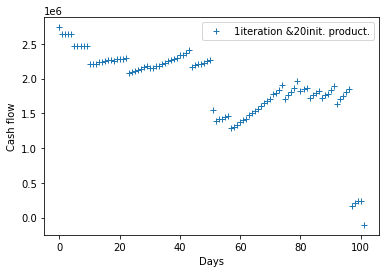

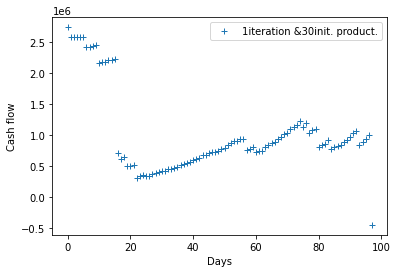

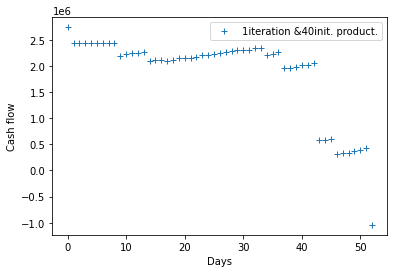

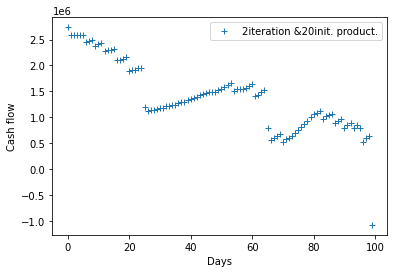

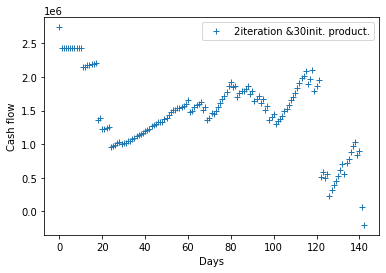

...

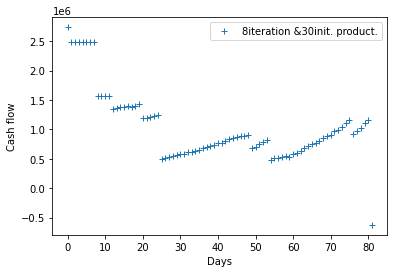

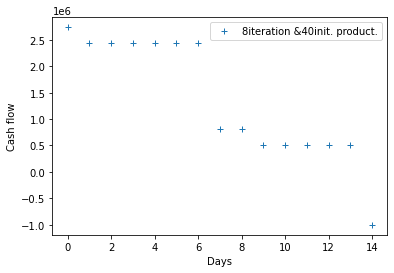

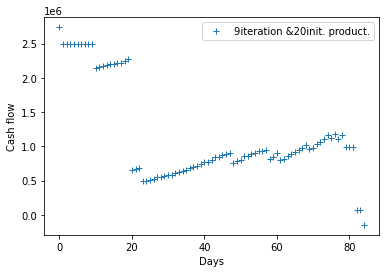

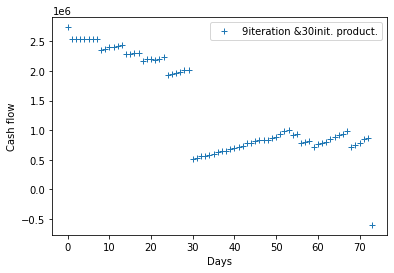

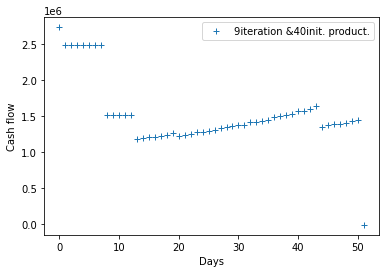

In [38]:
import pandas as pd
import numpy as np
import math
import random
import matplotlib.pyplot as plt
# demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
# demand=pd.concat([demand,demand],axis=0)
# xx=pd.DataFrame([[0,1]])
# xx.columns=demand.columns
# data1=pd.concat([xx,demand],axis=0)
# data1=data1.reset_index().drop(['index'],axis=1)
# data2=data1.copy()
# data2['wip']=0
# data2['warehouse']=0
# data2['shipment']=0
# data2['lost_demand']=0
# data2['cost']=0
# data2['cash']=2738867.06
# data2['demand']=0
# data2['process']=0
# data2['shipping_way']=0
# data2['profit']=0

# data2=data2.drop(['Calopeia'],axis=1)

# data2['demand'] = data1['Calopeia']
# last=data2
# last['cash'].iloc[1:] = 0
# last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
# last=pd.read_csv('./last.csv')
# last=last.astype('float')
# last=last.reset_index().drop(['index'],axis=1)
# print(last)
# total_production_parameter =[100,150,200,250,300]
# shipping_method_parameter=['truck','mail']
# reorder_point_parameter=[100,150,200,250,300,350,400]
# capa_surplus_parameter = [0 , 5, 10]
for iteration in np.arange(1,10):
  for initial_production in [20,30,40]:
    capa=initial_production
    demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
    demand=pd.concat([demand,demand],axis=0)
    xx=pd.DataFrame([[0,1]])
    xx.columns=demand.columns
    data1=pd.concat([xx,demand],axis=0)
    data1=data1.reset_index().drop(['index'],axis=1)
    data2=data1.copy()
    data2['wip']=0
    data2['warehouse']=0
    data2['shipment']=0
    data2['lost_demand']=0
    data2['cost']=0
    data2['cash']=2738867.06
    data2['demand']=0
    data2['process']=0
    data2['shipping_way']=0
    data2['profit']=0

    data2=data2.drop(['Calopeia'],axis=1)

    data2['demand'] = data1['Calopeia']
    last=data2
    last['cash'].iloc[1:] = 0
    last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
    last=pd.read_csv('./last.csv')
    last=last.astype('float')
    last=last.reset_index().drop(['index'],axis=1)
    print(last)
    total_production_parameter =[100,150,200,250,300]
    shipping_method_parameter=['truck','mail']
    reorder_point_parameter=[100,150,200,250,300,350,400]
    capa_surplus_parameter = [0 , 5, 10]
    for a,b,c,d,e,f,g,h,i,j,ind in zip(last['day'],last['wip'],last['warehouse'],last['shipment'],last['lost_demand'],last['cost'],last['cash'],last['demand'],last['process'],last['shipping_way'],last.index): 
      total_production = float(random.choice(total_production_parameter))
      shipping_method = str(random.choice(shipping_method_parameter))
      reorder_point = float(random.choice(reorder_point_parameter))
      daily_production = capa + float(random.choice(capa_surplus_parameter))
        ########################case1#############################  
      if (i == 0) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case1')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case2#############################
      if (0 < c < reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case2')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450*c
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case3#############################
      if (0 < c < reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case3')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = 1450 * h
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h  + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case4#############################
      if (i == 1) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case4')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 0
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case5#############################
      if (0 < c < reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case5')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450 * c
        production_cost=0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case6#############################
      if (0 < c < reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case6')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + c
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case7#############################
      if (i == 3) & (c == 0):
        print('Current day is',str(ind)+'.')
        print('case7')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        holding_cost = 0
        customer_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case8#############################
      if (0< c < reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case8')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = c * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case9#############################
      if (0 < c < reorder_point ) & (i == 3) & (c > h):
        print('Current day is',str(ind)+'.')
        print('case9')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = h * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = h * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case10#############################
      if (c >= reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case10')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case11#############################
      if (c >= reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case11')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case12#############################
      if (c >= reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case12')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case13#############################
      if (c >= reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case13')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case14#############################
      if (c >= reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case14')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        holding_cost = c * 100/365
        customer_cost = c * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case15#############################
      if (c >= reorder_point ) & (i == 3) & (c > h):
        print('Current day is', str(ind)+'.')
        print('case15')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        holding_cost = c * 100/365
        customer_cost = h * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case stop#############################
        ########################end of days#############################
      if ind == 731:
        plt.figure()
        plt.xlabel('Days')
        plt.ylabel('Cash flow')
        plt.plot(last.index[:731], last['cash'].iloc[:731], '+', label=str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        plt.legend()
        print('This iteration is', iteration)
        print('The total cash of',str(initial_production)+'initial production', 'is', last['cash'].iloc[ind])
        last.to_csv('./'+str(iteration)+'_'+str(initial_production)+'_log.csv',index=False,encoding='utf-8-sig')
        break
        ########################bankruptcy#############################
      if last['cash'].iloc[ind] <0:
        print('bankruptcy !!')
        plt.figure()
        plt.xlabel('Days')
        plt.ylabel('Cash flow')
        plt.plot(last.index[:ind+1], last['cash'].iloc[:ind+1], '+', label=str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        plt.legend()
        break

# If bankruptcy is assumed....

## If total cost is greater than current cash, there is no order.


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  shipment  ...  demand  process  shipping_way  profit
0       0.0  0.0        0.0       0.0  ...     1.0      0.0           0.0     0.0
1       1.0  0.0        0.0       0.0  ...    11.0      0.0           0.0     0.0
2       2.0  0.0        0.0       0.0  ...     7.0      0.0           0.0     0.0
3       3.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
4       4.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
...     ...  ...        ...       ...  ...     ...      ...           ...     ...
1456  726.0  0.0        0.0       0.0  ...    17.0      0.0           0.0     0.0
1457  727.0  0.0        0.0       0.0  ...     2.0      0.0           0.0     0.0
1458  728.0  0.0        0.0       0.0  ...     8.0      0.0           0.0     0.0
1459  729.0  0.0        0.0       0.0  ...     4.0      0.0           0.0     0.0
1460  730.0  0.0        0.0       0.0  ...    10.0      0.0           0.0     0.0

[1461 rows x 11

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:590: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


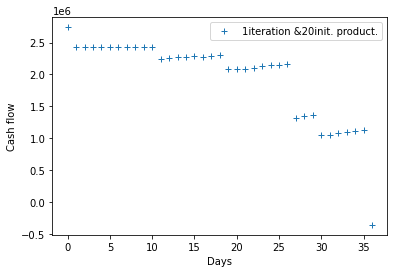

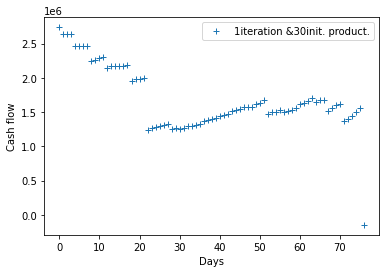

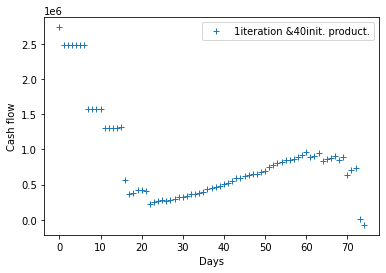

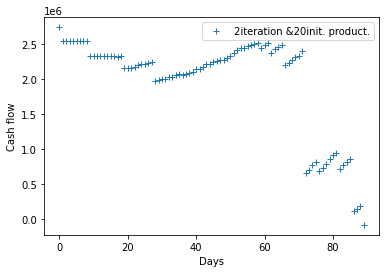

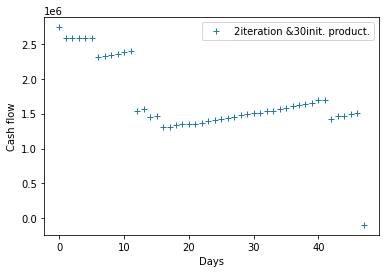

...

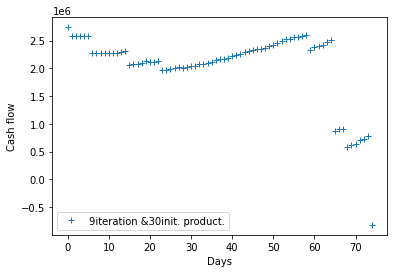

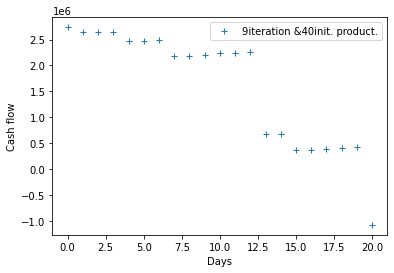

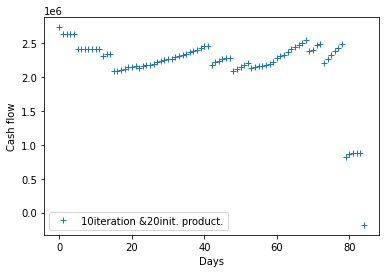

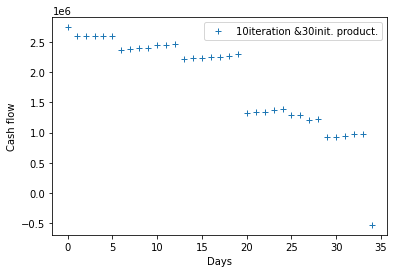

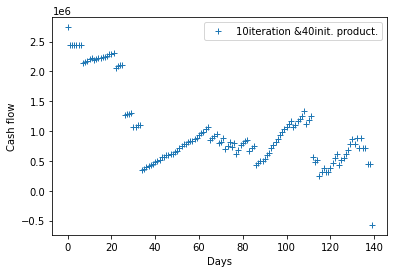

In [40]:
import pandas as pd
import numpy as np
import math
import random
import matplotlib.pyplot as plt
# demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
# demand=pd.concat([demand,demand],axis=0)
# xx=pd.DataFrame([[0,1]])
# xx.columns=demand.columns
# data1=pd.concat([xx,demand],axis=0)
# data1=data1.reset_index().drop(['index'],axis=1)
# data2=data1.copy()
# data2['wip']=0
# data2['warehouse']=0
# data2['shipment']=0
# data2['lost_demand']=0
# data2['cost']=0
# data2['cash']=2738867.06
# data2['demand']=0
# data2['process']=0
# data2['shipping_way']=0
# data2['profit']=0

# data2=data2.drop(['Calopeia'],axis=1)

# data2['demand'] = data1['Calopeia']
# last=data2
# last['cash'].iloc[1:] = 0
# last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
# last=pd.read_csv('./last.csv')
# last=last.astype('float')
# last=last.reset_index().drop(['index'],axis=1)
# print(last)
# total_production_parameter =[100,150,200,250,300]
# shipping_method_parameter=['truck','mail']
# reorder_point_parameter=[100,150,200,250,300,350,400]
# capa_surplus_parameter = [0 , 5, 10]
for iteration in np.arange(1,11):
  for initial_production in [20,30,40]:
    capa=initial_production
    demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
    demand=pd.concat([demand,demand],axis=0)
    xx=pd.DataFrame([[0,1]])
    xx.columns=demand.columns
    data1=pd.concat([xx,demand],axis=0)
    data1=data1.reset_index().drop(['index'],axis=1)
    data2=data1.copy()
    data2['wip']=0
    data2['warehouse']=0
    data2['shipment']=0
    data2['lost_demand']=0
    data2['cost']=0
    data2['cash']=2738867.06
    data2['demand']=0
    data2['process']=0
    data2['shipping_way']=0
    data2['profit']=0

    data2=data2.drop(['Calopeia'],axis=1)

    data2['demand'] = data1['Calopeia']
    last=data2
    last['cash'].iloc[1:] = 0
    last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
    last=pd.read_csv('./last.csv')
    last=last.astype('float')
    last=last.reset_index().drop(['index'],axis=1)
    print(last)
    total_production_parameter =[100,150,200,250,300]
    shipping_method_parameter=['truck','mail']
    reorder_point_parameter=[100,150,200,250,300,350,400]
    capa_surplus_parameter = [0 , 5, 10]
    for a,b,c,d,e,f,g,h,i,j,ind in zip(last['day'],last['wip'],last['warehouse'],last['shipment'],last['lost_demand'],last['cost'],last['cash'],last['demand'],last['process'],last['shipping_way'],last.index): 
      total_production = float(random.choice(total_production_parameter))
      shipping_method = str(random.choice(shipping_method_parameter))
      reorder_point = float(random.choice(reorder_point_parameter))
      daily_production = capa + float(random.choice(capa_surplus_parameter))
        ########################case1#############################  
      if (i == 0) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case1')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case2#############################
      if (0 < c < reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case2')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450*c
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case3#############################
      if (0 < c < reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case3')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = 1450 * h
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h  + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case4#############################
      if (i == 1) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case4')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 0
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case5#############################
      if (0 < c < reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case5')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450 * c
        production_cost=0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case6#############################
      if (0 < c < reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case6')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + c
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case7#############################
      if (i == 3) & (c == 0):
        print('Current day is',str(ind)+'.')
        print('case7')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        holding_cost = 0
        customer_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case8#############################
      if (0< c < reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case8')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = c * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case9#############################
      if (0 < c < reorder_point ) & (i == 3) & (c > h):
        print('Current day is',str(ind)+'.')
        print('case9')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = h * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = h * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case10#############################
      if (c >= reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case10')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case11#############################
      if (c >= reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case11')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case12#############################
      if (c >= reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case12')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case13#############################
      if (c >= reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case13')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case14#############################
      if (c >= reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case14')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        holding_cost = c * 100/365
        customer_cost = c * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case15#############################
      if (c >= reorder_point ) & (i == 3) & (c > h):
        print('Current day is', str(ind)+'.')
        print('case15')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        holding_cost = c * 100/365
        customer_cost = h * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case stop#############################
        ########################end of days#############################
      if ind == 731:
        plt.figure()
        plt.xlabel('Days')
        plt.ylabel('Cash flow')
        plt.plot(last.index[:731], last['cash'].iloc[:731], '+', label=str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        plt.legend()
        print('This iteration is', iteration)
        print('The total cash of',str(initial_production)+'initial production', 'is', last['cash'].iloc[ind])
        last.to_csv('./'+str(iteration)+'_'+str(initial_production)+'_log.csv',index=False,encoding='utf-8-sig')
        plt.savefig('./'+str(iteration)+'_'+str(initial_production)+'_log.png')
        break
        ########################bankruptcy#############################
      if last['cash'].iloc[ind] <0:
        print('bankruptcy !!')
        plt.figure()
        plt.xlabel('Days')
        plt.ylabel('Cash flow')
        plt.plot(last.index[:ind+1], last['cash'].iloc[:ind+1], '+', label=str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        last.to_csv('./bankruptcy_'+str(iteration)+'_'+str(initial_production)+'_log.csv',index=False,encoding='utf-8-sig')
        plt.savefig('./bankruptcy_'+str(iteration)+'_'+str(initial_production)+'_log.png')
        plt.legend()
        break

# Default simulation

When quantity is high.

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current cash: 2370867.06
current process status: 1.0
current warehouse is: 0.0
          cash  profit  cost  warehouse    wip
8   2370867.06     0.0   0.0        0.0  250.0
9   2370867.06     0.0   0.0        0.0  250.0
10        0.00     0.0   0.0        0.0  250.0
11        0.00     0.0   0.0      100.0  250.0
12        0.00     0.0   0.0        0.0  250.0
13        0.00     0.0   0.0        0.0    0.0
14        0.00     0.0   0.0        0.0    0.0
15        0.00     0.0   0.0        0.0    0.0
16        0.00     0.0   0.0        0.0    0.0
17        0.00     0.0   0.0        0.0    0.0


Current day is  9.
case4
current capa: 30.0
current quantity 250.0
current reorder_point 200.0
current shipping method mail
current cash: 2370867.06
current process status: 1.0
current warehouse is: 0.0
          cash  profit  cost  warehouse    wip
9   2370867.06     0.0   0.0        0.0  250.0
10  2370867.06     0.0   0.0        0.0  250.0
11        0.00     0.0

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
45  0.000000e+00      0.0     0.000000        0.0  0.0
46  0.000000e+00      0.0     0.000000        0.0  0.0
47  0.000000e+00      0.0     0.000000        0.0  0.0
48  0.000000e+00      0.0     0.000000        0.0  0.0
49  0.000000e+00      0.0     0.000000        0.0  0.0
50  0.000000e+00      0.0     0.000000        0.0  0.0


Current day is  42.
case11
current capa: 20.0
current quantity 250.0
current reorder_point 150.0
current shipping method mail
current cash: 2409613.909315068
current process status: 0.0
current warehouse is: 334.0
            cash   profit         cost  warehouse  wip
42  2.409614e+06  47850.0  5041.506849      334.0  0.0
43  2.452422e+06      0.0     0.000000      301.0  0.0
44  0.000000e+00      0.0     0.000000        0.0  0.0
45  0.000000e+00      0.0     0.000000        0.0  0.0
46  0.000000e+00      0.0     0.000000        0.0  0.0
47  0.000000e+00      0.0     0.000000        0.0  0.0
48  0.000000e+00      0.0     0.0

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
65      0.000000      0.0     0.00000        0.0  250.0
66      0.000000      0.0     0.00000        0.0  250.0
67      0.000000      0.0     0.00000        0.0  250.0
68      0.000000      0.0     0.00000        0.0  250.0


Current day is  60.
case6
current capa: 20.0
current quantity 250.0
current reorder_point 300.0
current shipping method mail
current cash: 97630.34767123316
current process status: 1.0
current warehouse is: 256.0
             cash   profit         cost  warehouse    wip
60   97630.347671  26100.0  2770.136986      256.0  250.0
61  120960.210685      0.0     0.000000      238.0  250.0
62       0.000000      0.0     0.000000        0.0  250.0
63       0.000000      0.0     0.000000        0.0  250.0
64       0.000000      0.0     0.000000        0.0  250.0
65       0.000000      0.0     0.000000        0.0  250.0
66       0.000000      0.0     0.000000        0.0  250.0
67       0.000000      0.0     0.000000        0.0  250.0
68 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 20
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 30
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


        day  wip  warehouse  ...  shipment_cost  hold_cost  fulfillment_cost
0       0.0  0.0        0.0  ...            0.0        0.0               0.0
1       1.0  0.0        0.0  ...            0.0        0.0               0.0
2       2.0  0.0        0.0  ...            0.0        0.0               0.0
3       3.0  0.0        0.0  ...            0.0        0.0               0.0
4       4.0  0.0        0.0  ...            0.0        0.0               0.0
...     ...  ...        ...  ...            ...        ...               ...
1456  726.0  0.0        0.0  ...            0.0        0.0               0.0
1457  727.0  0.0        0.0  ...            0.0        0.0               0.0
1458  728.0  0.0        0.0  ...            0.0        0.0               0.0
1459  729.0  0.0        0.0  ...            0.0        0.0               0.0
1460  730.0  0.0        0.0  ...            0.0        0.0               0.0

[1461 rows x 15 columns]
Current day is  0.
case1
current capa: 40
current 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:775: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


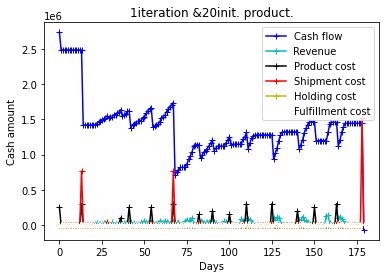

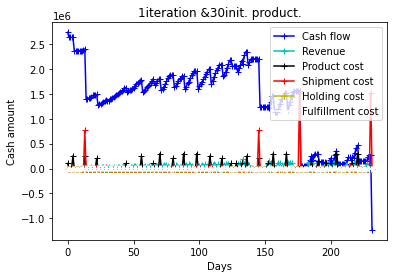

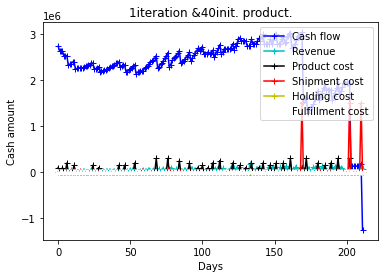

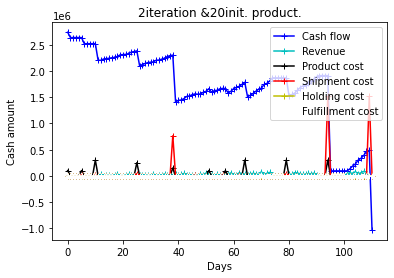

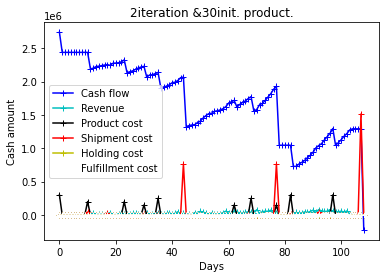

...

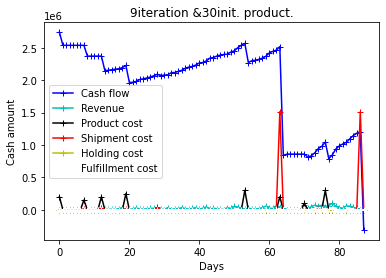

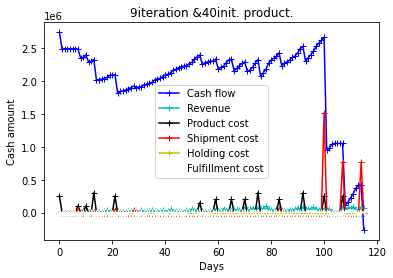

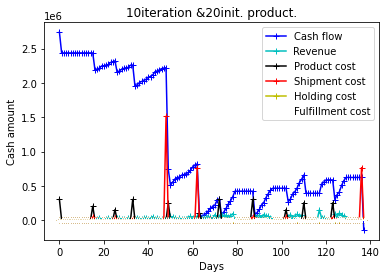

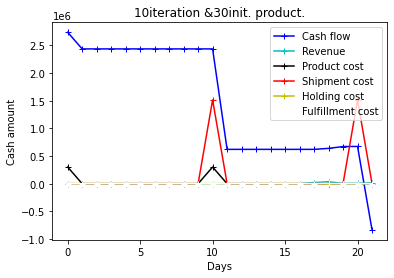

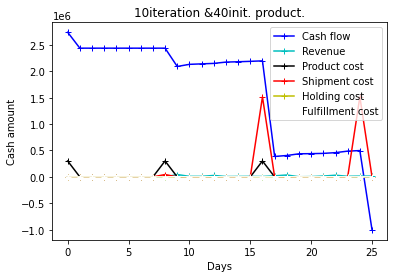

In [45]:
import pandas as pd
import numpy as np
import math
import random
import matplotlib.pyplot as plt
# demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
# demand=pd.concat([demand,demand],axis=0)
# xx=pd.DataFrame([[0,1]])
# xx.columns=demand.columns
# data1=pd.concat([xx,demand],axis=0)
# data1=data1.reset_index().drop(['index'],axis=1)
# data2=data1.copy()
# data2['wip']=0
# data2['warehouse']=0
# data2['shipment']=0
# data2['lost_demand']=0
# data2['cost']=0
# data2['cash']=2738867.06
# data2['demand']=0
# data2['process']=0
# data2['shipping_way']=0
# data2['profit']=0

# data2=data2.drop(['Calopeia'],axis=1)

# data2['demand'] = data1['Calopeia']
# last=data2
# last['cash'].iloc[1:] = 0
# last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
# last=pd.read_csv('./last.csv')
# last=last.astype('float')
# last=last.reset_index().drop(['index'],axis=1)
# print(last)
# total_production_parameter =[100,150,200,250,300]
# shipping_method_parameter=['truck','mail']
# reorder_point_parameter=[100,150,200,250,300,350,400]
# capa_surplus_parameter = [0 , 5, 10]
for iteration in np.arange(1,11):
  for initial_production in [20,30,40]:
    capa=initial_production
    demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
    demand=pd.concat([demand,demand],axis=0)
    xx=pd.DataFrame([[0,1]])
    xx.columns=demand.columns
    data1=pd.concat([xx,demand],axis=0)
    data1=data1.reset_index().drop(['index'],axis=1)
    data2=data1.copy()
    data2['wip']=0
    data2['warehouse']=0
    data2['shipment']=0
    data2['lost_demand']=0
    data2['cost']=0
    data2['cash']=2738867.06
    data2['demand']=0
    data2['process']=0
    data2['shipping_way']=0
    data2['profit']=0

    data2['product_cost'] = 0
    data2['shipment_cost'] = 0
    data2['hold_cost'] = 0
    data2['fulfillment_cost'] = 0
    data2=data2.drop(['Calopeia'],axis=1)

    data2['demand'] = data1['Calopeia']
    last=data2
    last['cash'].iloc[1:] = 0
    last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
    last=pd.read_csv('./last.csv')
    last=last.astype('float')
    last=last.reset_index().drop(['index'],axis=1)
    print(last)
    total_production_parameter =[100,150,200,250,300]
    shipping_method_parameter=['truck','mail']
    reorder_point_parameter=[100,150,200,250,300,350,400]
    capa_surplus_parameter = [0]
    for a,b,c,d,e,f,g,h,i,j,ind in zip(last['day'],last['wip'],last['warehouse'],last['shipment'],last['lost_demand'],last['cost'],last['cash'],last['demand'],last['process'],last['shipping_way'],last.index): 
      total_production = float(random.choice(total_production_parameter))
      shipping_method = str(random.choice(shipping_method_parameter))
      reorder_point = float(random.choice(reorder_point_parameter))
      daily_production = capa + float(random.choice(capa_surplus_parameter))
        ########################case1#############################  
      if (i == 0) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case1')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue

        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case2#############################
      if (0 < c < reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case2')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450*c
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case3#############################
      if (0 < c < reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case3')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = 1450 * h
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h  + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case4#############################
      if (i == 1) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case4')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 0
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case5#############################
      if (0 < c < reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case5')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450 * c
        production_cost=0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case6#############################
      if (0 < c < reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case6')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + c
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case7#############################
      if (i == 3) & (c == 0):
        print('Current day is',str(ind)+'.')
        print('case7')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        holding_cost = 0
        customer_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case8#############################
      if (0< c < reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case8')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = c * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case9#############################
      if (0 < c < reorder_point ) & (i == 3) & (c > h):
        print('Current day is',str(ind)+'.')
        print('case9')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = h * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = h * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case10#############################
      if (c >= reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case10')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case11#############################
      if (c >= reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case11')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case12#############################
      if (c >= reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case12')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case13#############################
      if (c >= reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case13')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case14#############################
      if (c >= reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case14')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        holding_cost = c * 100/365
        customer_cost = c * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case15#############################
      if (c >= reorder_point ) & (i == 3) & (c > h):
        print('Current day is', str(ind)+'.')
        print('case15')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        holding_cost = c * 100/365
        customer_cost = h * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case stop#############################
        ########################end of days#############################
      if ind == 731:
        plt.figure()
        plt.title(str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        plt.xlabel('Days')
        plt.ylabel('Cash amount')
        plt.plot(last.index[:731], last['cash'].iloc[:731], 'b+-', label='Cash flow')
        plt.plot(last.index[:731], last['profit'].iloc[:731], 'c+-', label='Revenue')
        plt.plot(last.index[:731], last['product_cost'].iloc[:731], 'k+-', label='Product cost')
        plt.plot(last.index[:731], last['shipment_cost'].iloc[:731], 'r+-', label='Shipment cost')
        plt.plot(last.index[:731], last['hold_cost'].iloc[:731], 'y+-', label='Holding cost')
        plt.plot(last.index[:731], last['fulfillment_cost'].iloc[:731], 'w+-', label='Fulfillment cost')
        plt.legend()
        print('This iteration is', iteration)
        print('The total cash of',str(initial_production)+'initial production', 'is', last['cash'].iloc[ind])
        last.to_csv('./'+str(iteration)+'_'+str(initial_production)+'_log.csv',index=False,encoding='utf-8-sig')
        plt.savefig('./'+str(iteration)+'_'+str(initial_production)+'_log.png')
        break
        ########################bankruptcy#############################
      if last['cash'].iloc[ind] <0:
        print('bankruptcy !!')
        plt.figure()
        plt.title(str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        plt.xlabel('Days')
        plt.ylabel('Cash amount')
        plt.plot(last.index[:ind+1], last['cash'].iloc[:ind+1], 'b+-', label='Cash flow')
        plt.plot(last.index[:ind+1], last['profit'].iloc[:ind+1], 'c+-', label='Revenue')
        plt.plot(last.index[:ind+1], last['product_cost'].iloc[:ind+1], 'k+-', label='Product cost')
        plt.plot(last.index[:ind+1], last['shipment_cost'].iloc[:ind+1], 'r+-', label='Shipment cost')
        plt.plot(last.index[:ind+1], last['hold_cost'].iloc[:ind+1], 'y+-', label='Holding cost')
        plt.plot(last.index[:ind+1], last['fulfillment_cost'].iloc[:ind+1], 'w+-', label='Fulfillment cost')
        plt.legend()
        last.to_csv('./bankruptcy_'+str(iteration)+'_'+str(initial_production)+'_log.csv',index=False,encoding='utf-8-sig')
        plt.savefig('./bankruptcy_'+str(iteration)+'_'+str(initial_production)+'_log.png')
        plt.legend()
        break

# When quantity is distributed more smaller than previous one

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
513  0.000000e+00      0.0     0.00000        0.0  100.0
514  0.000000e+00      0.0     0.00000        0.0    0.0
515  0.000000e+00      0.0     0.00000        0.0    0.0
516  0.000000e+00      0.0     0.00000        0.0    0.0
517  0.000000e+00      0.0     0.00000        0.0    0.0
518  0.000000e+00      0.0     0.00000        0.0    0.0
519  0.000000e+00      0.0     0.00000        0.0    0.0


Current day is  511.
case6
current capa: 20.0
current quantity 100.0
current reorder_point 150.0
current shipping method truck
current cash: 3388905.9641095875
current process status: 1.0
current warehouse is: 122.0
             cash    profit          cost  warehouse    wip
511  3.388906e+06  130500.0  13533.424658      122.0  100.0
512  3.505873e+06       0.0      0.000000       32.0  100.0
513  0.000000e+00       0.0      0.000000        0.0  100.0
514  0.000000e+00       0.0      0.000000        0.0    0.0
515  0.000000e+00       0.0      0.000000      

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
518  0.000000e+00      0.0      0.000000        0.0   0.0
519  0.000000e+00      0.0      0.000000        0.0   0.0
520  0.000000e+00      0.0      0.000000        0.0   0.0
521  0.000000e+00      0.0      0.000000        0.0   0.0


Current day is  513.
case6
current capa: 30.0
current quantity 60.0
current reorder_point 250.0
current shipping method truck
current cash: 3648265.1421917817
current process status: 1.0
current warehouse is: 80.0
             cash   profit         cost  warehouse   wip
513  3.648265e+06  46400.0  4821.917808       80.0  60.0
514  3.689843e+06      0.0     0.000000       48.0   0.0
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000       50.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0
521

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current warehouse is: 183.0
             cash   profit         cost  warehouse   wip
513  3.775958e+06  46400.0  4850.136986      183.0  80.0
514  3.817508e+06      0.0     0.000000      151.0   0.0
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0
521  0.000000e+00      0.0     0.000000        0.0   0.0
522  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is 514.
case9
current capa: 40.0
current quantity 80.0
current reorder_point 300.0
current shipping method mail
current cash: 3817507.8819178077
current process status: 3.0
current warehouse is: 151.0
It is time to select your shipping method
You select your shipping way as a mail.
            

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current warehouse is: 0.0
             cash  profit  cost  warehouse   wip
510  3.550900e+06     0.0   0.0        0.0  90.0
511  3.550900e+06     0.0   0.0        0.0   0.0
512  0.000000e+00     0.0   0.0        0.0   0.0
513  0.000000e+00     0.0   0.0       50.0   0.0
514  0.000000e+00     0.0   0.0        0.0   0.0
515  0.000000e+00     0.0   0.0        0.0   0.0
516  0.000000e+00     0.0   0.0        0.0   0.0
517  0.000000e+00     0.0   0.0        0.0   0.0
518  0.000000e+00     0.0   0.0        0.0   0.0
519  0.000000e+00     0.0   0.0        0.0   0.0


Current day is 511.
case7
current capa: 20.0
current quantity 90.0
current reorder_point 200.0
current shipping method mail
current cash: 3550899.9367123237
current process status: 3.0
current warehouse is: 0.0
It is time to select your shipping method
You select your shipping way as a mail.
             cash  profit     cost  warehouse   wip
511  3.550900e+06     0.0  85000.0        0.0  70.0


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current process status: 1.0
current warehouse is: 0.0
             cash  profit  cost  warehouse   wip
512  3.553105e+06     0.0   0.0        0.0  70.0
513  3.553105e+06     0.0   0.0        0.0  70.0
514  0.000000e+00     0.0   0.0        0.0   0.0
515  0.000000e+00     0.0   0.0      100.0   0.0
516  0.000000e+00     0.0   0.0        0.0   0.0
517  0.000000e+00     0.0   0.0        0.0   0.0
518  0.000000e+00     0.0   0.0       70.0   0.0
519  0.000000e+00     0.0   0.0        0.0   0.0
520  0.000000e+00     0.0   0.0        0.0   0.0
521  0.000000e+00     0.0   0.0        0.0   0.0


Current day is  513.
case4
current capa: 30.0
current quantity 70.0
current reorder_point 400.0
current shipping method truck
current cash: 3553104.8682191735
current process status: 1.0
current warehouse is: 0.0
             cash  profit  cost  warehouse   wip
513  3.553105e+06     0.0   0.0        0.0  70.0
514  3.553105e+06     0.0   0.0        0.0   0.0
515  0.00

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
522  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is 514.
case8
current capa: 40.0
current quantity 90.0
current reorder_point 400.0
current shipping method truck
current cash: 3958358.56684931
current process status: 3.0
current warehouse is: 11.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash   profit           cost  warehouse   wip
514  3.958359e+06  15950.0  108153.013699       11.0  90.0
515  3.866156e+06      0.0       0.000000        0.0  90.0
516  0.000000e+00      0.0       0.000000       70.0  90.0
517  0.000000e+00      0.0       0.000000        0.0   0.0
518  0.000000e+00      0.0       0.000000        0.0   0.0
519  0.000000e+00      0.0       0.000000        0.0   0.0
520  0.000000e+00      0.0       0.000000        0.0   0.0
521  0.000000e+00      0.0       0.000000       90.0   0.0
522  0.000000e+00      0.0       0.0000

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
518  0.000000e+00      0.0     0.00000        0.0   0.0
519  0.000000e+00      0.0     0.00000        0.0   0.0


Current day is  511.
case13
current capa: 20.0
current quantity 60.0
current reorder_point 100.0
current shipping method mail
current cash: 3363438.8408219153
current process status: 1.0
current warehouse is: 162.0
             cash    profit          cost  warehouse   wip
511  3.363439e+06  130500.0  13544.383562      162.0  60.0
512  3.480394e+06       0.0      0.000000       72.0   0.0
513  0.000000e+00       0.0      0.000000        0.0   0.0
514  0.000000e+00       0.0      0.000000        0.0   0.0
515  0.000000e+00       0.0      0.000000        0.0   0.0
516  0.000000e+00       0.0      0.000000        0.0   0.0
517  0.000000e+00       0.0      0.000000        0.0   0.0
518  0.000000e+00       0.0      0.000000        0.0   0.0
519  0.000000e+00       0.0      0.000000        0.0   0.0
520  0.000000e+00       0.0      0.000000    

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0
521  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is 513.
case8
current capa: 30.0
current quantity 70.0
current reorder_point 400.0
current shipping method mail
current cash: 3831055.827123286
current process status: 3.0
current warehouse is: 25.0
It is time to select your shipping method
You select your shipping way as a mail.
             cash   profit          cost  warehouse   wip
513  3.831056e+06  36250.0  95756.849315       25.0  80.0
514  3.771549e+06      0.0      0.000000       70.0  80.0
515  0.000000e+00      0.0      0.000000        0.0  80.0
516  0.000000e+00      0.0      0.0000

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current cash: 3789784.594246572
current process status: 1.0
current warehouse is: 33.0
             cash   profit         cost  warehouse   wip
513  3.789785e+06  46400.0  4809.041096       33.0  70.0
514  3.831376e+06      0.0     0.000000        1.0   0.0
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000       60.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000      100.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0
521  0.000000e+00      0.0     0.000000        0.0   0.0
522  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is 514.
case8
current capa: 40.0
current quantity 70.0
current reorder_point 250.0
current shipping method mail
current cash: 3831375.5531506813
current process status: 3.0
current warehouse is: 1.0
It is time to select your shipping me

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current reorder_point 300.0
current shipping method mail
current cash: 3420878.5668493146
current process status: 3.0
current warehouse is: 62.0
It is time to select your shipping method
You select your shipping way as a mail.
             cash   profit          cost  warehouse   wip
511  3.420879e+06  89900.0  75816.986301       62.0  50.0
512  3.434962e+06      0.0      0.000000      100.0  50.0
513  0.000000e+00      0.0      0.000000       50.0  50.0
514  0.000000e+00      0.0      0.000000        0.0   0.0
515  0.000000e+00      0.0      0.000000        0.0   0.0
516  0.000000e+00      0.0      0.000000        0.0   0.0
517  0.000000e+00      0.0      0.000000        0.0   0.0
518  0.000000e+00      0.0      0.000000        0.0   0.0
519  0.000000e+00      0.0      0.000000        0.0   0.0
520  0.000000e+00      0.0      0.000000        0.0   0.0


Current day is  512.
case6
current capa: 20.0
current quantity 50.0
current reorder_point 350.0
c

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
520  0.000000e+00      0.0     0.000000        0.0    0.0
521  0.000000e+00      0.0     0.000000        0.0    0.0


Current day is  513.
case6
current capa: 30.0
current quantity 100.0
current reorder_point 100.0
current shipping method truck
current cash: 3770174.4572602697
current process status: 1.0
current warehouse is: 33.0
             cash   profit         cost  warehouse    wip
513  3.770174e+06  46400.0  4809.041096       33.0  100.0
514  3.811765e+06      0.0     0.000000        1.0    0.0
515  0.000000e+00      0.0     0.000000        0.0    0.0
516  0.000000e+00      0.0     0.000000        0.0    0.0
517  0.000000e+00      0.0     0.000000        0.0    0.0
518  0.000000e+00      0.0     0.000000        0.0    0.0
519  0.000000e+00      0.0     0.000000        0.0    0.0
520  0.000000e+00      0.0     0.000000        0.0    0.0
521  0.000000e+00      0.0     0.000000        0.0    0.0
522  0.000000e+00      0.0     0.000000        0.0 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
520  0.000000e+00      0.0      0.000000        0.0   0.0
521  0.000000e+00      0.0      0.000000        0.0   0.0
522  0.000000e+00      0.0      0.000000        0.0   0.0


Current day is  514.
case6
current capa: 40.0
current quantity 60.0
current reorder_point 100.0
current shipping method mail
current cash: 3879575.0052054827
current process status: 1.0
current warehouse is: 71.0
             cash   profit         cost  warehouse   wip
514  3.879575e+06  84100.0  8719.452055       71.0  60.0
515  3.954956e+06      0.0     0.000000       13.0   0.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0
521  0.000000e+00      0.0     0.000000        0.0   0.0
522  0.000000e+00      0.0     0.000000        0.0   0.0
523  

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
517  0.000000e+00     0.0   0.0        0.0   0.0
518  0.000000e+00     0.0   0.0        0.0   0.0
519  0.000000e+00     0.0   0.0        0.0   0.0


Current day is  511.
case4
current capa: 20.0
current quantity 50.0
current reorder_point 250.0
current shipping method mail
current cash: 3409179.936712324
current process status: 1.0
current warehouse is: 0.0
             cash  profit  cost  warehouse   wip
511  3.409180e+06     0.0   0.0        0.0  50.0
512  3.409180e+06     0.0   0.0       50.0   0.0
513  0.000000e+00     0.0   0.0        0.0   0.0
514  0.000000e+00     0.0   0.0        0.0   0.0
515  0.000000e+00     0.0   0.0        0.0   0.0
516  0.000000e+00     0.0   0.0       80.0   0.0
517  0.000000e+00     0.0   0.0        0.0   0.0
518  0.000000e+00     0.0   0.0        0.0   0.0
519  0.000000e+00     0.0   0.0        0.0   0.0
520  0.000000e+00     0.0   0.0        0.0   0.0


Current day is 512.
case9
current capa: 20.0
current quantity 5

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current warehouse is: 0.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash  profit     cost  warehouse   wip
512  3.593079e+06     0.0  76500.0        0.0  60.0
513  3.516579e+06     0.0      0.0       70.0  60.0
514  0.000000e+00     0.0      0.0        0.0   0.0
515  0.000000e+00     0.0      0.0        0.0   0.0
516  0.000000e+00     0.0      0.0       70.0   0.0
517  0.000000e+00     0.0      0.0        0.0   0.0
518  0.000000e+00     0.0      0.0        0.0   0.0
519  0.000000e+00     0.0      0.0       70.0   0.0
520  0.000000e+00     0.0      0.0        0.0   0.0
521  0.000000e+00     0.0      0.0        0.0   0.0


Current day is  513.
case6
current capa: 30.0
current quantity 60.0
current reorder_point 150.0
current shipping method truck
current cash: 3516578.840821917
current process status: 1.0
current warehouse is: 70.0
             cash   profit 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
515  0.000000e+00      0.0       0.000000        0.0  90.0
516  0.000000e+00      0.0       0.000000        0.0   0.0
517  0.000000e+00      0.0       0.000000        0.0   0.0
518  0.000000e+00      0.0       0.000000       60.0   0.0
519  0.000000e+00      0.0       0.000000        0.0   0.0
520  0.000000e+00      0.0       0.000000        0.0   0.0
521  0.000000e+00      0.0       0.000000        0.0   0.0
522  0.000000e+00      0.0       0.000000        0.0   0.0


Current day is  514.
case6
current capa: 40.0
current quantity 90.0
current reorder_point 300.0
current shipping method truck
current cash: 3666696.1010958888
current process status: 1.0
current warehouse is: 133.0
             cash   profit         cost  warehouse   wip
514  3.666696e+06  84100.0  8736.438356      133.0  90.0
515  3.742060e+06      0.0     0.000000       75.0  90.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000        

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
514  0.000000e+00     0.0   0.0        0.0   0.0
515  0.000000e+00     0.0   0.0        0.0   0.0
516  0.000000e+00     0.0   0.0        0.0   0.0
517  0.000000e+00     0.0   0.0        0.0   0.0
518  0.000000e+00     0.0   0.0        0.0   0.0
519  0.000000e+00     0.0   0.0        0.0   0.0


Current day is 511.
case7
current capa: 20.0
current quantity 90.0
current reorder_point 350.0
current shipping method mail
current cash: 3535815.005205474
current process status: 3.0
current warehouse is: 0.0
It is time to select your shipping method
You select your shipping way as a mail.
             cash  profit     cost  warehouse   wip
511  3.535815e+06     0.0  85000.0        0.0  70.0
512  3.450815e+06     0.0      0.0       90.0  70.0
513  0.000000e+00     0.0      0.0        0.0  70.0
514  0.000000e+00     0.0      0.0        0.0  70.0
515  0.000000e+00     0.0      0.0        0.0   0.0
516  0.000000e+00     0.0      0.0        0.0   0.0
517  0.00000

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash   profit          cost  warehouse   wip
512  3.701416e+06  39150.0  90561.506849       42.0  70.0
513  3.650004e+06      0.0      0.000000       75.0  70.0
514  0.000000e+00      0.0      0.000000        0.0  70.0
515  0.000000e+00      0.0      0.000000        0.0   0.0
516  0.000000e+00      0.0      0.000000        0.0   0.0
517  0.000000e+00      0.0      0.000000        0.0   0.0
518  0.000000e+00      0.0      0.000000        0.0   0.0
519  0.000000e+00      0.0      0.000000       90.0   0.0
520  0.000000e+00      0.0      0.000000        0.0   0.0
521  0.000000e+00      0.0      0.000000        0.0   0.0


Current day is  513.
case6
current capa: 30.0
current quantity 70.0
current reorder_point 300.0
current shipping method truck
current cash: 3650004.3202739707
current process status: 1.0
current warehouse is: 75.0
             cash   profit  

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current reorder_point 300.0
current shipping method truck
current cash: 3734892.8134246543
current process status: 1.0
current warehouse is: 0.0
             cash  profit  cost  warehouse   wip
514  3.734893e+06     0.0   0.0        0.0  50.0
515  3.734893e+06     0.0   0.0        0.0   0.0
516  0.000000e+00     0.0   0.0       90.0   0.0
517  0.000000e+00     0.0   0.0        0.0   0.0
518  0.000000e+00     0.0   0.0       80.0   0.0
519  0.000000e+00     0.0   0.0        0.0   0.0
520  0.000000e+00     0.0   0.0       60.0   0.0
521  0.000000e+00     0.0   0.0        0.0   0.0
522  0.000000e+00     0.0   0.0        0.0   0.0
523  0.000000e+00     0.0   0.0        0.0   0.0


Current day is 515.
case7
current capa: 40.0
current quantity 50.0
current reorder_point 100.0
current shipping method mail
current cash: 3734892.8134246543
current process status: 3.0
current warehouse is: 0.0
It is time to select your shipping method
You select your shipping 

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.


Current day is 511.
case7
current capa: 20.0
current quantity 90.0
current reorder_point 400.0
current shipping method truck
current cash: 3551375.553150682
current process status: 3.0
current warehouse is: 0.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash  profit     cost  warehouse   wip
511  3.551376e+06     0.0  96500.0        0.0  80.0
512  3.454876e+06     0.0      0.0        0.0  80.0
513  0.000000e+00     0.0      0.0        0.0  80.0
514  0.000000e+00     0.0      0.0        0.0  80.0
515  0.000000e+00     0.0      0.0        0.0   0.0
516  0.000000e+00     0.0      0.0        0.0   0.0
517  0.000000e+00     0.0      0.0        0.0   0.0
518  0.000000e+00     0.0      0.0       90.0   0.0
519  0.000000e+00     0.0      0.0        0.0   0.0
520  0.000000e+00     0.0      0.0        0.0   0.0


Current day is  512.
case4
current capa: 20.0
current

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
520  0.000000e+00     0.0   0.0        0.0   0.0
521  0.000000e+00     0.0   0.0        0.0   0.0


Current day is 513.
case7
current capa: 30.0
current quantity 90.0
current reorder_point 300.0
current shipping method truck
current cash: 3878613.635342462
current process status: 3.0
current warehouse is: 0.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash  profit     cost  warehouse   wip
513  3.878614e+06     0.0  86500.0        0.0  70.0
514  3.792114e+06     0.0      0.0        0.0  70.0
515  0.000000e+00     0.0      0.0        0.0  70.0
516  0.000000e+00     0.0      0.0        0.0   0.0
517  0.000000e+00     0.0      0.0        0.0   0.0
518  0.000000e+00     0.0      0.0        0.0   0.0
519  0.000000e+00     0.0      0.0        0.0   0.0
520  0.000000e+00     0.0      0.0       90.0   0.0
521  0.000000e+00     0.0      0.0        0.0   0.0
522  0.00

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
514  3.941746e+06      0.0     0.00000       68.0   0.0
515  0.000000e+00      0.0     0.00000        0.0   0.0
516  0.000000e+00      0.0     0.00000        0.0   0.0
517  0.000000e+00      0.0     0.00000        0.0   0.0
518  0.000000e+00      0.0     0.00000        0.0   0.0
519  0.000000e+00      0.0     0.00000        0.0   0.0
520  0.000000e+00      0.0     0.00000        0.0   0.0
521  0.000000e+00      0.0     0.00000        0.0   0.0
522  0.000000e+00      0.0     0.00000        0.0   0.0


Current day is 514.
case9
current capa: 40.0
current quantity 80.0
current reorder_point 300.0
current shipping method mail
current cash: 3941745.690136982
current process status: 3.0
current warehouse is: 68.0
It is time to select your shipping method
You select your shipping way as a mail.
             cash   profit           cost  warehouse   wip
514  3.941746e+06  84100.0  102218.630137       68.0  80.0
515  3.923627e+06      0.0       0.000000      

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


This iteration is 7
The total cash of 40initial production is 4226765.964109579


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Current day is 511.
case7
current capa: 20.0
current quantity 70.0
current reorder_point 200.0
current shipping method truck
current cash: 3468189.25178082
current process status: 3.0
current warehouse is: 0.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash  profit      cost  warehouse   wip
511  3.468189e+06     0.0  106500.0        0.0  90.0
512  3.361689e+06     0.0       0.0        0.0  90.0
513  0.000000e+00     0.0       0.0        0.0  90.0
514  0.000000e+00     0.0       0.0      100.0  90.0
515  0.000000e+00     0.0       0.0        0.0  90.0
516  0.000000e+00     0.0       0.0        0.0   0.0
517  0.000000e+00     0.0       0.0        0.0   0.0
518  0.000000e+00     0.0       0.0       70.0   0.0
519  0.000000e+00     0.0       0.0        0.0   0.0
520  0.000000e+00     0.0       0.0        0.0   0.0


Current day is  512.
case4
current capa: 20.0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


This iteration is 8
The total cash of 20initial production is 3632945.41616438


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
515  0.000000e+00      0.0      0.000000        0.0   0.0
516  0.000000e+00      0.0      0.000000        0.0   0.0
517  0.000000e+00      0.0      0.000000       50.0   0.0
518  0.000000e+00      0.0      0.000000        0.0   0.0
519  0.000000e+00      0.0      0.000000        0.0   0.0
520  0.000000e+00      0.0      0.000000        0.0   0.0
521  0.000000e+00      0.0      0.000000        0.0   0.0


Current day is  513.
case6
current capa: 30.0
current quantity 80.0
current reorder_point 150.0
current shipping method truck
current cash: 3553083.224383558
current process status: 1.0
current warehouse is: 113.0
             cash   profit         cost  warehouse   wip
513  3.553083e+06  46400.0  4830.958904      113.0  80.0
514  3.594652e+06      0.0     0.000000       81.0  80.0
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000       50.0   0.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000      100.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0
521  0.000000e+00      0.0     0.000000        0.0   0.0
522  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is 514.
case9
current capa: 40.0
current quantity 70.0
current reorder_point 350.0
current shipping method truck
current cash: 3725328.1558904066
current process status: 3.0
current warehouse is: 98.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash   profit          cost  warehouse   wip
514  3.725328e+06  84100.0  75226.849315       98.0  50.0
515  3.734201e+06      0.0      0.000000       40.0  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current reorder_point 100.0
current shipping method mail
current cash: 3472804.0463013677
current process status: 1.0
current warehouse is: 62.0
             cash   profit         cost  warehouse   wip
511  3.472804e+06  89900.0  9316.986301       62.0  90.0
512  3.553387e+06      0.0     0.000000        0.0  90.0
513  0.000000e+00      0.0     0.000000        0.0  90.0
514  0.000000e+00      0.0     0.000000        0.0   0.0
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is  512.
case4
current capa: 20.0
current quantity 90.0
current reorder_point 200.0
current shipping method truck
current cash: 3553387.0599999977
current process status: 1.0
cur

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


This iteration is 9
The total cash of 20initial production is 3517905.964109589


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
513  3.629515e+06  46400.0  4827.39726      100.0  60.0
514  3.671088e+06      0.0     0.00000       68.0   0.0
515  0.000000e+00      0.0     0.00000      100.0   0.0
516  0.000000e+00      0.0     0.00000        0.0   0.0
517  0.000000e+00      0.0     0.00000        0.0   0.0
518  0.000000e+00      0.0     0.00000        0.0   0.0
519  0.000000e+00      0.0     0.00000        0.0   0.0
520  0.000000e+00      0.0     0.00000        0.0   0.0
521  0.000000e+00      0.0     0.00000        0.0   0.0
522  0.000000e+00      0.0     0.00000        0.0   0.0


Current day is 514.
case9
current capa: 30.0
current quantity 60.0
current reorder_point 250.0
current shipping method truck
current cash: 3671087.8819178035
current process status: 3.0
current warehouse is: 68.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.
             cash   profit           cost  warehouse   wip
514  3

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
             cash   profit          cost  warehouse   wip
513  3.971734e+06  46400.0  86811.780822       43.0  70.0
514  3.931322e+06      0.0      0.000000       81.0  70.0
515  0.000000e+00      0.0      0.000000        0.0   0.0
516  0.000000e+00      0.0      0.000000        0.0   0.0
517  0.000000e+00      0.0      0.000000        0.0   0.0
518  0.000000e+00      0.0      0.000000        0.0   0.0
519  0.000000e+00      0.0      0.000000        0.0   0.0
520  0.000000e+00      0.0      0.000000        0.0   0.0
521  0.000000e+00      0.0      0.000000        0.0   0.0
522  0.000000e+00      0.0      0.000000        0.0   0.0


Current day is  514.
case6
current capa: 40.0
current quantity 70.0
current reorder_point 350.0
current shipping method mail
current cash: 3931322.128493144
current process status: 1.0
current warehouse is: 81.0
             cash   profit         cost  warehouse   wip
514  3.931322e+06  84100.0  8722.191781       81.0  70.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


This iteration is 9
The total cash of 40initial production is 4186231.9915068466


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
517  0.000000e+00     0.0      0.0       90.0   0.0
518  0.000000e+00     0.0      0.0        0.0   0.0
519  0.000000e+00     0.0      0.0        0.0   0.0


Current day is  511.
case4
current capa: 20.0
current quantity 80.0
current reorder_point 350.0
current shipping method truck
current cash: 3407661.8545205486
current process status: 1.0
current warehouse is: 0.0
             cash  profit  cost  warehouse   wip
511  3.407662e+06     0.0   0.0        0.0  80.0
512  3.407662e+06     0.0   0.0        0.0  80.0
513  0.000000e+00     0.0   0.0        0.0  80.0
514  0.000000e+00     0.0   0.0        0.0   0.0
515  0.000000e+00     0.0   0.0        0.0   0.0
516  0.000000e+00     0.0   0.0        0.0   0.0
517  0.000000e+00     0.0   0.0       90.0   0.0
518  0.000000e+00     0.0   0.0        0.0   0.0
519  0.000000e+00     0.0   0.0        0.0   0.0
520  0.000000e+00     0.0   0.0        0.0   0.0


Current day is  512.
case4
current capa: 20.0
curren

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
             cash   profit         cost  warehouse   wip
512  3.631296e+06  39150.0  4071.917808       80.0  90.0
513  3.666374e+06      0.0     0.000000       53.0   0.0
514  0.000000e+00      0.0     0.000000       60.0   0.0
515  0.000000e+00      0.0     0.000000        0.0   0.0
516  0.000000e+00      0.0     0.000000        0.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000        0.0   0.0
521  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is 513.
case9
current capa: 30.0
current quantity 90.0
current reorder_point 150.0
current shipping method truck
current cash: 3666373.635342464
current process status: 3.0
current warehouse is: 53.0
It is time to select your shipping method
Your shipping amounts are less than 200.
You select your shipping way as a truck.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


This iteration is 10
The total cash of 30initial production is 3887118.566849311


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
current shipping method truck
current cash: 3725895.5531506897
current process status: 1.0
current warehouse is: 91.0
             cash   profit         cost  warehouse   wip
514  3.725896e+06  84100.0  8724.931507       91.0  80.0
515  3.801271e+06      0.0     0.000000       33.0   0.0
516  0.000000e+00      0.0     0.000000       50.0   0.0
517  0.000000e+00      0.0     0.000000        0.0   0.0
518  0.000000e+00      0.0     0.000000        0.0   0.0
519  0.000000e+00      0.0     0.000000        0.0   0.0
520  0.000000e+00      0.0     0.000000       60.0   0.0
521  0.000000e+00      0.0     0.000000        0.0   0.0
522  0.000000e+00      0.0     0.000000        0.0   0.0
523  0.000000e+00      0.0     0.000000        0.0   0.0


Current day is 515.
case8
current capa: 40.0
current quantity 80.0
current reorder_point 150.0
current shipping method truck
current cash: 3801270.6216438403
current process status: 3.0
current warehouse is: 33.0
It i

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:756: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


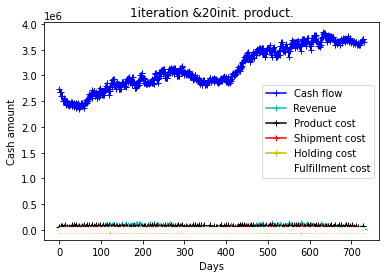

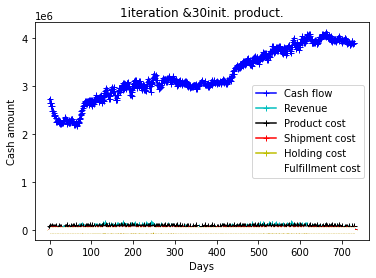

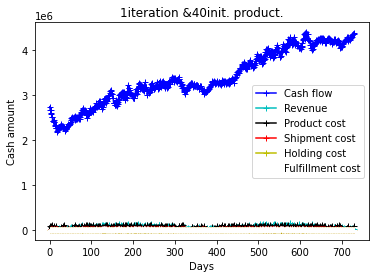

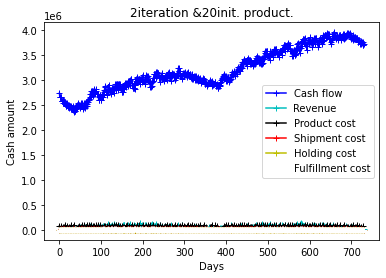

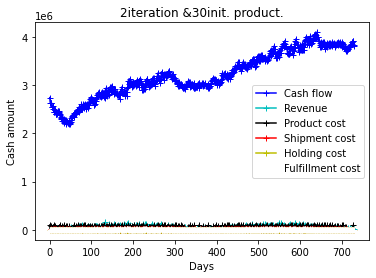

...

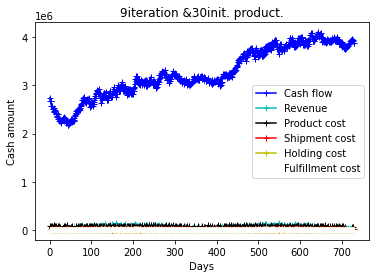

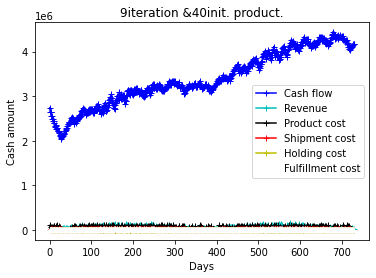

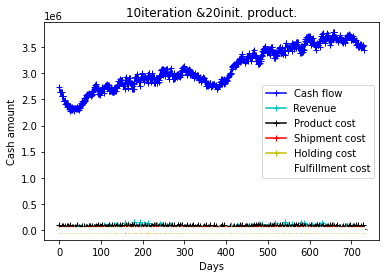

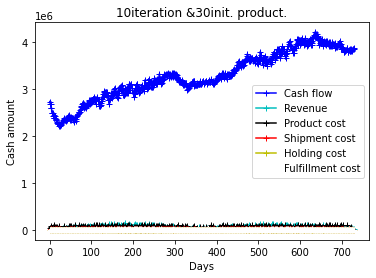

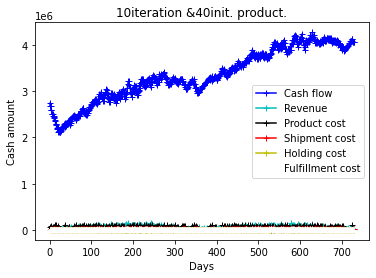

In [46]:
import pandas as pd
import numpy as np
import math
import random
import matplotlib.pyplot as plt
# demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
# demand=pd.concat([demand,demand],axis=0)
# xx=pd.DataFrame([[0,1]])
# xx.columns=demand.columns
# data1=pd.concat([xx,demand],axis=0)
# data1=data1.reset_index().drop(['index'],axis=1)
# data2=data1.copy()
# data2['wip']=0
# data2['warehouse']=0
# data2['shipment']=0
# data2['lost_demand']=0
# data2['cost']=0
# data2['cash']=2738867.06
# data2['demand']=0
# data2['process']=0
# data2['shipping_way']=0
# data2['profit']=0

# data2=data2.drop(['Calopeia'],axis=1)

# data2['demand'] = data1['Calopeia']
# last=data2
# last['cash'].iloc[1:] = 0
# last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
# last=pd.read_csv('./last.csv')
# last=last.astype('float')
# last=last.reset_index().drop(['index'],axis=1)
# print(last)
# total_production_parameter =[100,150,200,250,300]
# shipping_method_parameter=['truck','mail']
# reorder_point_parameter=[100,150,200,250,300,350,400]
# capa_surplus_parameter = [0 , 5, 10]
for iteration in np.arange(1,11):
  for initial_production in [20,30,40]:
    capa=initial_production
    demand=pd.read_excel('/content/Demand for each destination region..xlsx','Sheet JS')
    demand=pd.concat([demand,demand],axis=0)
    xx=pd.DataFrame([[0,1]])
    xx.columns=demand.columns
    data1=pd.concat([xx,demand],axis=0)
    data1=data1.reset_index().drop(['index'],axis=1)
    data2=data1.copy()
    data2['wip']=0
    data2['warehouse']=0
    data2['shipment']=0
    data2['lost_demand']=0
    data2['cost']=0
    data2['cash']=2738867.06
    data2['demand']=0
    data2['process']=0
    data2['shipping_way']=0
    data2['profit']=0

    data2['product_cost'] = 0
    data2['shipment_cost'] = 0
    data2['hold_cost'] = 0
    data2['fulfillment_cost'] = 0
    data2=data2.drop(['Calopeia'],axis=1)

    data2['demand'] = data1['Calopeia']
    last=data2
    last['cash'].iloc[1:] = 0
    last.to_csv('./last.csv',index=False, encoding='utf-8-sig')
    last=pd.read_csv('./last.csv')
    last=last.astype('float')
    last=last.reset_index().drop(['index'],axis=1)
    print(last)
    total_production_parameter =[50,60,70,80,90,100]
    shipping_method_parameter=['truck','mail']
    reorder_point_parameter=[100,150,200,250,300,350,400]
    capa_surplus_parameter = [0]
    for a,b,c,d,e,f,g,h,i,j,ind in zip(last['day'],last['wip'],last['warehouse'],last['shipment'],last['lost_demand'],last['cost'],last['cash'],last['demand'],last['process'],last['shipping_way'],last.index): 
      total_production = float(random.choice(total_production_parameter))
      shipping_method = str(random.choice(shipping_method_parameter))
      reorder_point = float(random.choice(reorder_point_parameter))
      daily_production = capa + float(random.choice(capa_surplus_parameter))
        ########################case1#############################  
      if (i == 0) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case1')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue

        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case2#############################
      if (0 < c < reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case2')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450*c
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case3#############################
      if (0 < c < reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case3')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = 1450 * h
        production_cost = 1500 + 1000 * quantity
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h  + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case4#############################
      if (i == 1) &(c == 0):
        print('Current day is ', str(ind)+'.')
        print('case4')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 0
        shipping_cost = 0
        holding_cost = 0
        customer_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case5#############################
      if (0 < c < reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case5')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = 1450 * c
        production_cost=0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case6#############################
      if (0 < c < reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case6')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + c
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case7#############################
      if (i == 3) & (c == 0):
        print('Current day is',str(ind)+'.')
        print('case7')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = 0
        production_cost = 1500 + 1000 * quantity
        holding_cost = 0
        customer_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        last['shipping_way'].iloc[ind] = shipping_method
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case8#############################
      if (0< c < reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case8')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = c * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        last['shipping_way'].iloc[ind] = shipping_method
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case9#############################
      if (0 < c < reorder_point ) & (i == 3) & (c > h):
        print('Current day is',str(ind)+'.')
        print('case9')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        capa=daily_production # daily_production parameter  
        quantity=total_production # total_production parameter
        completed_quantity=quantity/capa
        completed_day=math.ceil(quantity/capa)
        last['process'].iloc[ind:ind+completed_day] = 1
        last['process'].iloc[ind+completed_day] = 3
        last['wip'].iloc[ind:ind+completed_day] = quantity
        revenue = h * 1450
        production_cost = 1500 + 1000 * quantity
        holding_cost = c * 100/365
        customer_cost = h * 150
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        if last['cash'].iloc[ind] + revenue < total_cost:
          print('You can not produce any products because of budget.')
          #
          last['process'].iloc[ind:ind+completed_day] = 0
          last['process'].iloc[ind+completed_day] = 0
          last['wip'].iloc[ind:ind+completed_day] = 0
          production_cost = 0
          total_cost=production_cost + shipping_cost + holding_cost + customer_cost
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        else:
          #
          last['cost'].iloc[ind] = total_cost
          last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
          #
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        last['shipping_way'].iloc[ind] = shipping_method
        #
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case10#############################
      if (c >= reorder_point) & (i == 0) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case10')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case11#############################
      if (c >= reorder_point) & (i == 0) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case11')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        production_cost = 0
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case12#############################
      if (c >= reorder_point) & (i == 1) & (c <= h):
        print('Current day is ', str(ind)+'.')
        print('case12')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * c
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case13#############################
      if (c >= reorder_point) & (i == 1) & (c > h):
        print('Current day is ', str(ind)+'.')
        print('case13')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        shipping_cost = 0
        holding_cost = c * 100/365
        customer_cost = 150 * h
        production_cost = 0
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case14#############################
      if (c >= reorder_point ) & (i == 3) & (c <= h):
        print('Current day is',str(ind)+'.')
        print('case14')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        last['lost_demand'].iloc[ind] = c-h
        revenue = c * 1450
        holding_cost = c * 100/365
        customer_cost = c * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way= shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        last['shipping_way'].iloc[ind] = shipping_method
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - c + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case15#############################
      if (c >= reorder_point ) & (i == 3) & (c > h):
        print('Current day is', str(ind)+'.')
        print('case15')
        print('current capa:', capa)
        print('current quantity', quantity)
        print('current reorder_point', reorder_point)
        print('current shipping method', shipping_method)
        print('current cash:',last['cash'].iloc[ind])
        print('current process status:',i)
        print('current warehouse is:',c)
        revenue = h * 1450
        holding_cost = c * 100/365
        customer_cost = h * 150
        production_cost = 0
        print('It is time to select your shipping method')
        while True:
          shipping_way=shipping_method # shipping_method
          if shipping_way == 'truck':
            if last['wip'].iloc[ind-1] <=200:
              print('Your shipping amounts are less than 200.')
              shipping_cost= 15000
            if last['wip'].iloc[ind-1] >200:
              print('Your shipping amounts are greater than 200.')
              shipping_cost= 15000 * (last['wip'].iloc[ind-1] // 200 + math.ceil(last['wip'].iloc[ind-1] % 200))
            last['warehouse'].iloc[ind+7] =last['warehouse'].iloc[ind+7] + last['wip'].iloc[ind-1]
            print('You select your shipping way as a truck.')
            break
          if shipping_way == 'mail':
            print('You select your shipping way as a mail.')
            shipping_cost = 150 * last['wip'].iloc[ind-1]
            last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] + last['wip'].iloc[ind-1]
            break
        total_cost=production_cost + shipping_cost + holding_cost + customer_cost
        last['profit'].iloc[ind] = revenue
        last['cost'].iloc[ind] = total_cost
        #
        last['product_cost'].iloc[ind] = production_cost
        last['shipment_cost'].iloc[ind] = shipping_cost
        last['hold_cost'].iloc[ind] = holding_cost
        last['fulfillment_cost'].iloc[ind] = customer_cost
        last['shipping_way'].iloc[ind] = shipping_method
        #
        last['cash'].iloc[ind+1] = last['cash'].iloc[ind] - total_cost + revenue
        last['warehouse'].iloc[ind+1] = last['warehouse'].iloc[ind+1] - h + last['warehouse'].iloc[ind]
        print(last[['cash','profit','cost','warehouse','wip']][ind:ind+10])
        print()
        print()
        ########################case stop#############################
        ########################end of days#############################
      if ind == 731:
        plt.figure()
        plt.title(str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        plt.xlabel('Days')
        plt.ylabel('Cash amount')
        plt.plot(last.index[:731], last['cash'].iloc[:731], 'b+-', label='Cash flow')
        plt.plot(last.index[:731], last['profit'].iloc[:731], 'c+-', label='Revenue')
        plt.plot(last.index[:731], last['product_cost'].iloc[:731], 'k+-', label='Product cost')
        plt.plot(last.index[:731], last['shipment_cost'].iloc[:731], 'r+-', label='Shipment cost')
        plt.plot(last.index[:731], last['hold_cost'].iloc[:731], 'y+-', label='Holding cost')
        plt.plot(last.index[:731], last['fulfillment_cost'].iloc[:731], 'w+-', label='Fulfillment cost')
        plt.legend()
        print('This iteration is', iteration)
        print('The total cash of',str(initial_production)+'initial production', 'is', last['cash'].iloc[ind])
        last.to_csv('./'+str(iteration)+'_'+str(initial_production)+'_log.csv',index=False,encoding='utf-8-sig')
        plt.savefig('./'+str(iteration)+'_'+str(initial_production)+'_log.png')
        break
        ########################bankruptcy#############################
      if last['cash'].iloc[ind] <0:
        print('bankruptcy !!')
        plt.figure()
        plt.title('Bankruptcy '+str(iteration)+'iteration &'+str(initial_production)+'init. product.')
        plt.xlabel('Days')
        plt.ylabel('Cash amount')
        plt.plot(last.index[:ind+1], last['cash'].iloc[:ind+1], 'b+-', label='Cash flow')
        plt.plot(last.index[:ind+1], last['profit'].iloc[:ind+1], 'c+-', label='Revenue')
        plt.plot(last.index[:ind+1], last['product_cost'].iloc[:ind+1], 'k+-', label='Product cost')
        plt.plot(last.index[:ind+1], last['shipment_cost'].iloc[:ind+1], 'r+-', label='Shipment cost')
        plt.plot(last.index[:ind+1], last['hold_cost'].iloc[:ind+1], 'y+-', label='Holding cost')
        plt.plot(last.index[:ind+1], last['fulfillment_cost'].iloc[:ind+1], 'w+-', label='Fulfillment cost')
        plt.legend()
        last.to_csv('./bankruptcy_'+str(iteration)+'_'+str(initial_production)+'_log.csv',index=False,encoding='utf-8-sig')
        plt.savefig('./bankruptcy_'+str(iteration)+'_'+str(initial_production)+'_log.png')
        plt.legend()
        break